# CAM Combination

## 1. Import modules

In [1]:
import sys
import os
sys.path.append(os.path.abspath('..'))

In [2]:
from typing import Union, List
from enum import Enum
import json

from PIL import Image
import numpy as np

import torch
from torchvision import transforms
import torchvision.models as models

import matplotlib.pyplot as plt

import pytorch_grad_cam as cam
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

## 2. Utils

In [11]:
class CAMType(Enum):
    GRAD_CAM = cam.GradCAM
    HI_RES_CAM = cam.HiResCAM
    GRAD_CAM_ELEMENT_WISE = cam.GradCAMElementWise
    ABLATION_CAM = cam.AblationCAM
    X_GRAD_CAM = cam.XGradCAM
    GRAD_CAM_PLUS_PLUS = cam.GradCAMPlusPlus
    SCORE_CAM = cam.ScoreCAM
    LAYER_CAM = cam.LayerCAM
    EIGEN_CAM = cam.EigenCAM
    EIGEN_GRAD_CAM = cam.EigenGradCAM
    KPCA_CAM = cam.KPCA_CAM
    RANDOM_CAM = cam.RandomCAM
    FULL_GRAD = cam.FullGrad

def get_cam(cam_type: CAMType, model: torch.nn.Module, target_layers: torch.nn.Module):
    cam_class = cam_type.value
    return cam_class(model=model, target_layers=target_layers)

def visualize(grayscale: torch.Tensor, rgb_img: np.ndarray):
    visualization = show_cam_on_image(rgb_img, grayscale, use_rgb=True)
    plt.imshow(visualization)
    plt.axis('off')
    plt.show()

def display_images_in_rows(rgb_img: np.ndarray, grayscale_list: List[torch.Tensor], labels: List[str]):
    """
    Displays a list of images in rows, with each row containing up to max_images_per_row images.
    
    Args:
        images (list of np.ndarray): List of images to display.
        labels (list of str): List of labels for each image.
        max_images_per_row (int): Maximum number of images per row (default is 4).
    """

    images = [rgb_img]

    for grayscale in grayscale_list:
        images.append(show_cam_on_image(rgb_img, grayscale, use_rgb=True))

    labels.insert(0, "Image")

    fig, axes = plt.subplots(1, 4, figsize=(15, 5))

    # Loop through the images and labels to display them
    for ax, img, label in zip(axes, images, labels):
        ax.imshow(img)  # Show the image
        ax.set_title(label)  # Set the title
        ax.axis('off')  # Hide axes

    plt.tight_layout()
    plt.show()

def execute_cam(
        img_path: str,
        preprocess: transforms.Compose, model: torch.nn.Module,
        target_layers: List[torch.nn.Module],
        cam_type: CAMType,
        targets: Union[List[ClassifierOutputTarget], None] = None,
        visualization: bool = False,
        output_path: Union[str, None] = None
    ):
        model_name = "unknown"
        target_layer_name = "unknown"
        try:
            model_name = model._get_name()
            target_layer_name = target_layers[0]._get_name()
        except:
            pass

        print(f"Executing CAM on {model_name} with target layer {target_layer_name}:")

        # Load the image from file
        rgb_img = Image.open(img_path).convert('RGB')

        # Apply the transformations to the image and add a batch dimension
        input_tensor = preprocess(rgb_img).unsqueeze(0)  # Add batch dimension (1, 3, 224, 224)

        # Forward to get target class if not specified
        if not targets:
            with torch.no_grad():
                predicted_class = model(input_tensor).max(1)[-1]
                targets = [ClassifierOutputTarget(predicted_class)]
                print(f"Target class: {labels[str(predicted_class.item())][1]}")

        cam = get_cam(cam_type=cam_type, model=model, target_layers=target_layers)

        # Generate the CAM
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
        grayscale_cam = grayscale_cam[0, :]  # For a single image

        # Overlay the CAM on the image
        if visualization:
            # Convert the PIL image to a NumPy array for visualization
            rgb_img = np.array(rgb_img.resize((224, 224))) / 255.0  # Normalize the pixel values
            
            visualize(grayscale=grayscale_cam, rgb_img=rgb_img)

            # Optionally, you can save the resulting CAM visualization
            if output_path:
                Image.fromarray((visualization * 255).astype(np.uint8)).save(output_path)
                print(f"Saved output image to {output_path}")

        return grayscale_cam

labels = json.load(open("../pytorch_grad_cam/utils/imagenet_class_index.json"))

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

## 3. Theory

1. Grad-CAM
- Pros: Works well with any convolutional network; relatively fast.
- Cons: Relies on gradients, which can lead to noisy maps or vanish for some deeper layers.

2. Grad-CAM++
- Pros: An improved version of Grad-CAM, capturing finer details and multiple occurrences of objects in a class.
- Best Use: Multi-object scenarios (e.g., multiple instances of a class in an image).
- Cons: Slightly more computationally expensive than Grad-CAM.

3. HiRes-CAM
- Pros: Generates high-resolution saliency maps by preserving more local pixel-level details.
- Best Use: For applications requiring sharper heatmaps, such as medical imaging.

4. XGrad-CAM
- Pros: Incorporates both activation maps and gradients with an improved weighting strategy over Grad-CAM.
- Best Use: More stable for networks with deeper architectures.

5. Ablation-CAM
- Pros: More robust to noisy gradients by using ablations (masking individual neurons).
- Best Use: When accuracy of the heatmap is more important than speed.
- Cons: Very computationally expensive.

6. Eigen-CAM / EigenGrad-CAM
- Pros: Uses principal components of activations to provide class-agnostic visualizations.
- Best Use: For visualizing general features without focusing on specific class gradients.

7. Layer-CAM
- Pros: Works well by propagating relevance through each layer, improving interpretability in complex models.
- Best Use: Deep networks with multiple layers, such as ResNets.

8. Score-CAM
- Pros: Does not rely on gradients, making it more robust to gradient noise.
- Cons: Requires multiple forward passes, making it slower than Grad-CAM.

9. KPCA-CAM
- Pros: Uses kernel principal component analysis (KPCA) to capture non-linear patterns.
- Best Use: When you suspect the patterns are highly non-linear.

10. Random-CAM
- Purpose: Provides random visualizations (usually for benchmarking against other CAMs).

11. Full-Grad
- Pros: Aggregates both gradients and biases across the network, providing richer interpretability.
- Best Use: For complex models where biases and residuals play a role.

## 4. Experiments

In [13]:
def display_images_in_rows(
    rgb_img: np.ndarray, 
    grayscale_list: List[torch.Tensor], 
    labels: List[str], 
    max_images_per_row: int = 4
):
    """
    Displays a list of images in rows, with each row containing up to max_images_per_row images.
    
    Args:
        rgb_img (np.ndarray): The original RGB image to display.
        grayscale_list (List[torch.Tensor]): List of grayscale CAM heatmaps.
        labels (List[str]): List of labels for each image.
        max_images_per_row (int): Maximum number of images per row (default is 4).
    """

    # Prepare all images: original image + CAM heatmaps overlaid
    images = [rgb_img] + [show_cam_on_image(rgb_img, grayscale, use_rgb=True) for grayscale in grayscale_list]
    labels = ["Original Image"] + labels

    # Calculate rows and columns dynamically
    total_images = len(images)
    rows = (total_images + max_images_per_row - 1) // max_images_per_row
    cols = min(max_images_per_row, total_images)

    # Create the plot with dynamic rows and columns
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = axes.flatten()  # Flatten the axes array for easy iteration

    # Plot each image with its label
    for i, (img, label) in enumerate(zip(images, labels)):
        axes[i].imshow(img)
        axes[i].set_title(label)
        axes[i].axis('off')

    # Hide any remaining empty axes
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()


### 3.1. Alexnet

In [27]:
alexnet = models.alexnet(weights=models.AlexNet_Weights.DEFAULT).eval()
target_layers = [alexnet.features[10]]

In [31]:
print(alexnet)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo


100%|██████████| 16/16 [00:02<00:00,  7.60it/s]


Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo


100%|██████████| 8/8 [00:02<00:00,  3.47it/s]


Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Executing CAM on AlexNet with target layer Conv2d:
Target class: sulphur-crested_cockatoo
Combining GradCAM++ and ScoreCAM:


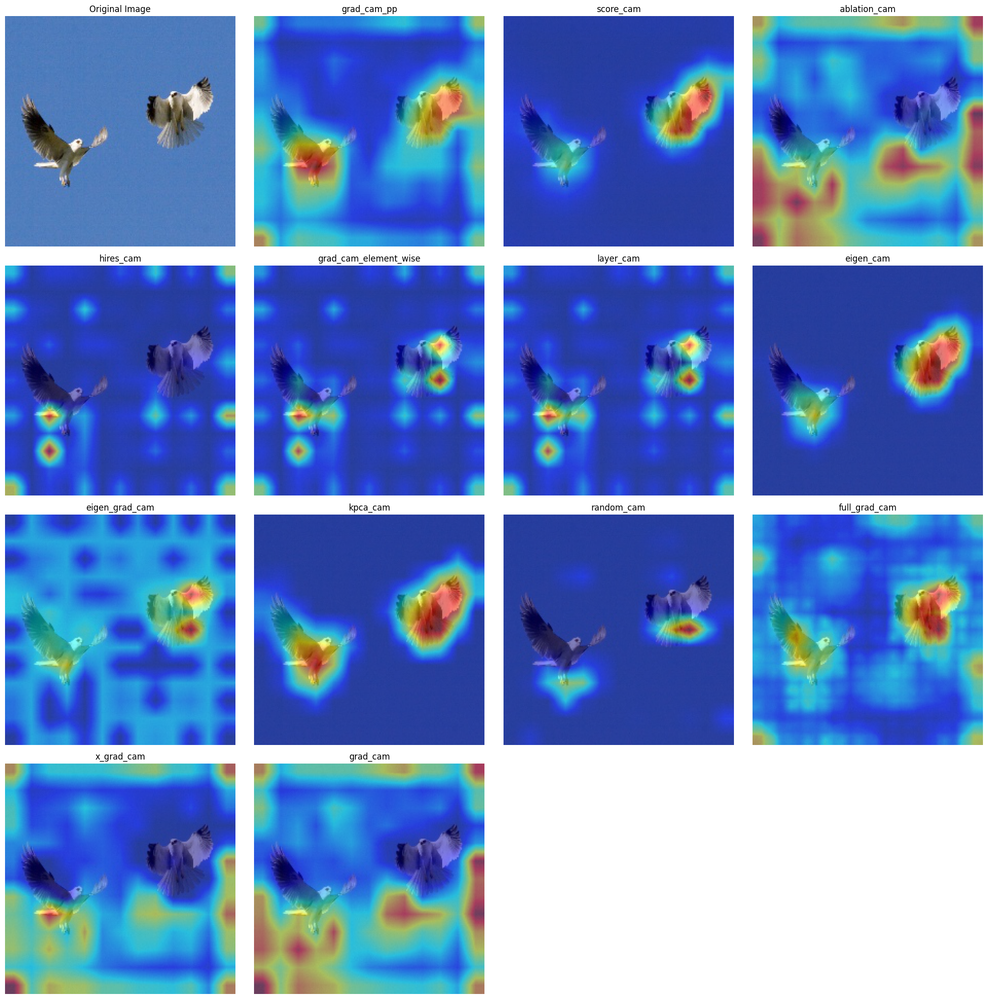

In [14]:
img_path = "../images/ILSVRC2012_val_00000073.JPEG"

grad_cam_pp = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.GRAD_CAM_PLUS_PLUS)
score_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.SCORE_CAM)
ablation_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.ABLATION_CAM)
hires_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.HI_RES_CAM)
grad_cam_element_wise = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.GRAD_CAM_ELEMENT_WISE)
layer_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.LAYER_CAM)
eigen_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.EIGEN_CAM)
eigen_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.EIGEN_GRAD_CAM)
kpca_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.KPCA_CAM)
random_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.RANDOM_CAM)
full_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.FULL_GRAD)
x_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.X_GRAD_CAM)
grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=alexnet, target_layers=target_layers, cam_type=CAMType.GRAD_CAM)


print("Combining GradCAM++ and ScoreCAM:")
rgb_img = Image.open(img_path).convert('RGB')
rgb_img = np.array(rgb_img.resize((224, 224))) / 255.0

display_images_in_rows(rgb_img=rgb_img, grayscale_list=[grad_cam_pp, score_cam, ablation_cam, hires_cam, grad_cam_element_wise, layer_cam, eigen_cam, eigen_grad_cam, kpca_cam, random_cam, full_grad_cam, x_grad_cam, grad_cam], labels=['grad_cam_pp', 'score_cam', 'ablation_cam', 'hires_cam', 'grad_cam_element_wise', 'layer_cam', 'eigen_cam', 'eigen_grad_cam', 'kpca_cam', 'random_cam', 'full_grad_cam', 'x_grad_cam', 'grad_cam'], max_images_per_row=4)

### 3.1. Resnet50

In [40]:
resnet50 = models.resnet50(weights=models.ResNet50_Weights.DEFAULT).eval()
target_layers = [resnet50.layer4[-1]]

In [41]:
print(target_layers)

Bottleneck(
  (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
)


In [30]:
print(resnet50)
# print(target_layers)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite


100%|██████████| 128/128 [02:20<00:00,  1.10s/it]


Executing CAM on ResNet with target layer Bottleneck:
Target class: kite


100%|██████████| 64/64 [02:20<00:00,  2.20s/it]


Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Executing CAM on ResNet with target layer Bottleneck:
Target class: kite
Combining GradCAM++ and ScoreCAM:


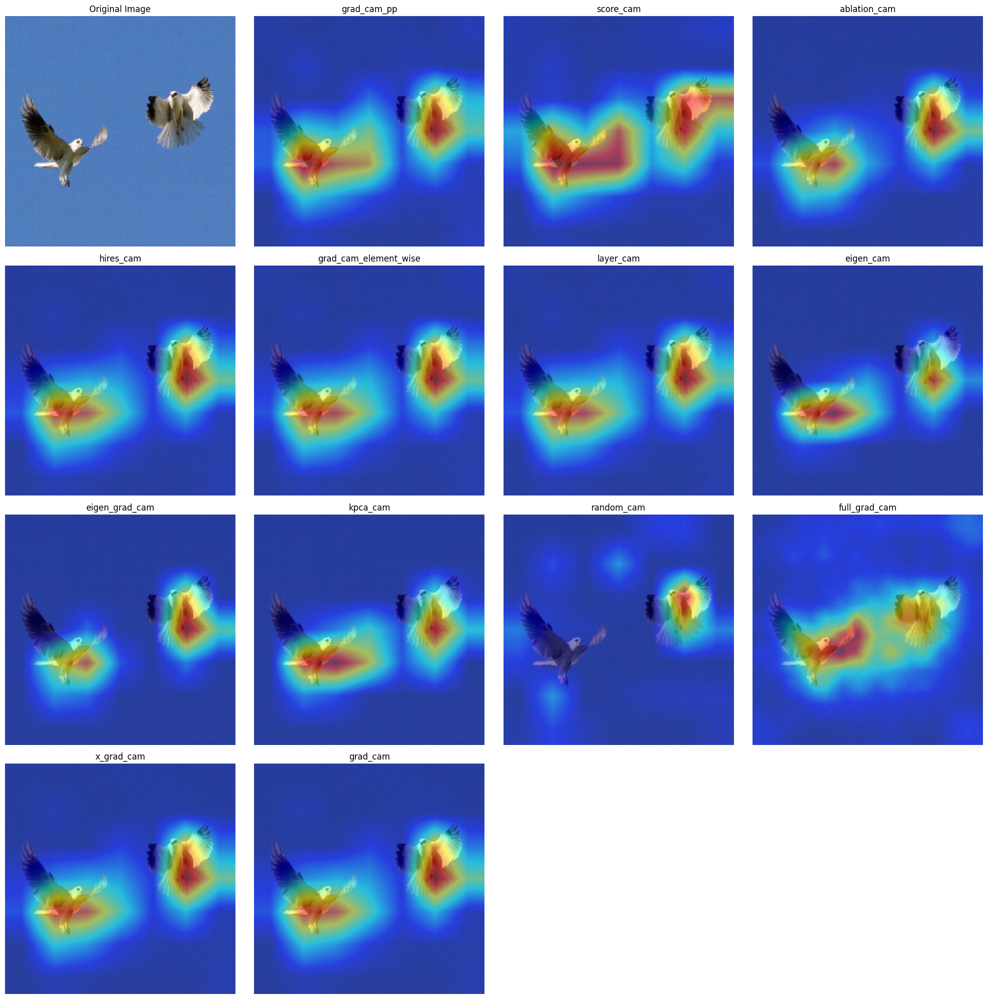

In [35]:
img_path = "../images/ILSVRC2012_val_00000073.JPEG"

grad_cam_pp = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.GRAD_CAM_PLUS_PLUS)
score_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.SCORE_CAM)
ablation_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.ABLATION_CAM)
hires_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.HI_RES_CAM)
grad_cam_element_wise = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.GRAD_CAM_ELEMENT_WISE)
layer_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.LAYER_CAM)
eigen_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.EIGEN_CAM)
eigen_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.EIGEN_GRAD_CAM)
kpca_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.KPCA_CAM)
random_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.RANDOM_CAM)
full_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.FULL_GRAD)
x_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.X_GRAD_CAM)
grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=resnet50, target_layers=target_layers, cam_type=CAMType.GRAD_CAM)


print("Combining GradCAM++ and ScoreCAM:")
rgb_img = Image.open(img_path).convert('RGB')
rgb_img = np.array(rgb_img.resize((224, 224))) / 255.0

display_images_in_rows(rgb_img=rgb_img, grayscale_list=[grad_cam_pp, score_cam, ablation_cam, hires_cam, grad_cam_element_wise, layer_cam, eigen_cam, eigen_grad_cam, kpca_cam, random_cam, full_grad_cam, x_grad_cam, grad_cam], labels=['grad_cam_pp', 'score_cam', 'ablation_cam', 'hires_cam', 'grad_cam_element_wise', 'layer_cam', 'eigen_cam', 'eigen_grad_cam', 'kpca_cam', 'random_cam', 'full_grad_cam', 'x_grad_cam', 'grad_cam'], max_images_per_row=4)

### 3.1. EfficientNet-B7

In [44]:
efficientnet_b7 = models.efficientnet_b7(weights=models.EfficientNet_B7_Weights.DEFAULT).eval()
target_layers = [efficientnet_b7.features[-1][0]]

Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite


100%|██████████| 160/160 [10:02<00:00,  3.77s/it]


Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite


100%|██████████| 80/80 [10:57<00:00,  8.22s/it]


Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Executing CAM on EfficientNet with target layer Conv2d:
Target class: kite
Combining GradCAM++ and ScoreCAM:


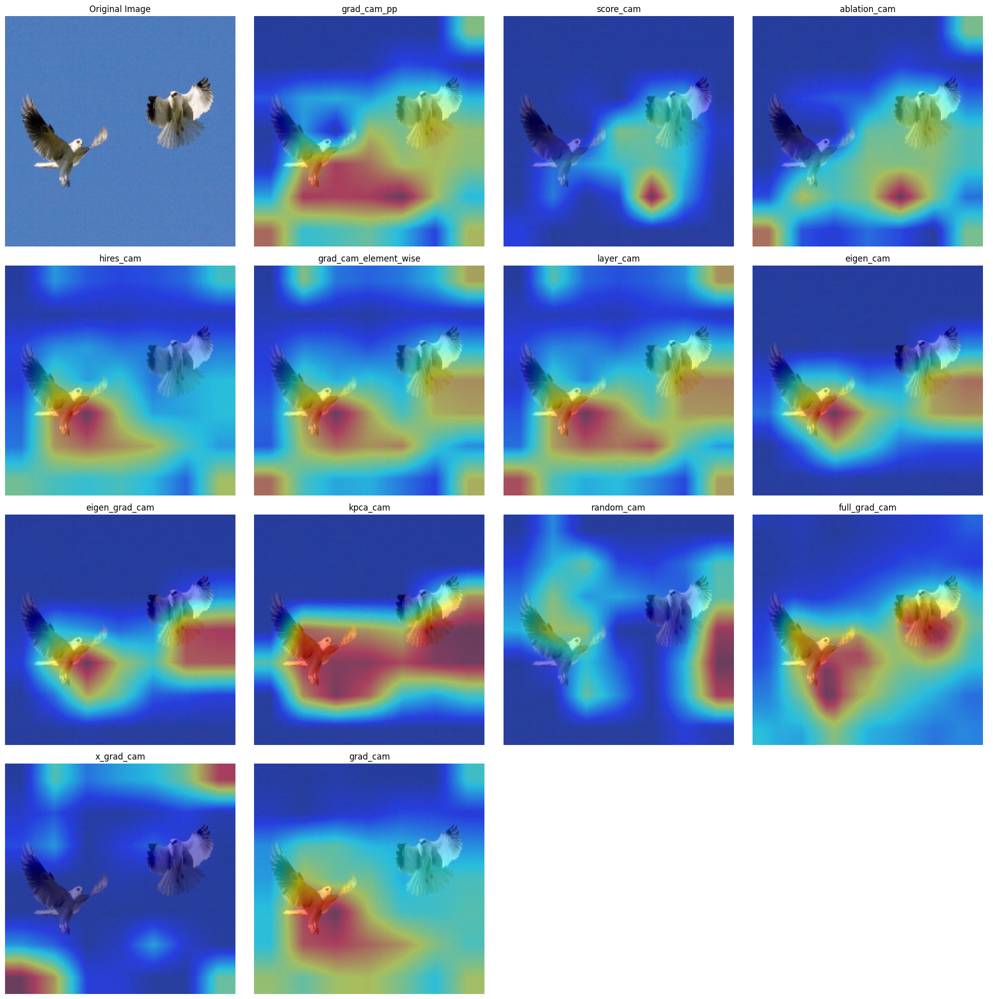

In [45]:
img_path = "../images/ILSVRC2012_val_00000073.JPEG"

grad_cam_pp = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.GRAD_CAM_PLUS_PLUS)
score_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.SCORE_CAM)
ablation_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.ABLATION_CAM)
hires_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.HI_RES_CAM)
grad_cam_element_wise = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.GRAD_CAM_ELEMENT_WISE)
layer_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.LAYER_CAM)
eigen_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.EIGEN_CAM)
eigen_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.EIGEN_GRAD_CAM)
kpca_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.KPCA_CAM)
random_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.RANDOM_CAM)
full_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.FULL_GRAD)
x_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.X_GRAD_CAM)
grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=efficientnet_b7, target_layers=target_layers, cam_type=CAMType.GRAD_CAM)


print("Combining GradCAM++ and ScoreCAM:")
rgb_img = Image.open(img_path).convert('RGB')
rgb_img = np.array(rgb_img.resize((224, 224))) / 255.0

display_images_in_rows(rgb_img=rgb_img, grayscale_list=[grad_cam_pp, score_cam, ablation_cam, hires_cam, grad_cam_element_wise, layer_cam, eigen_cam, eigen_grad_cam, kpca_cam, random_cam, full_grad_cam, x_grad_cam, grad_cam], labels=['grad_cam_pp', 'score_cam', 'ablation_cam', 'hires_cam', 'grad_cam_element_wise', 'layer_cam', 'eigen_cam', 'eigen_grad_cam', 'kpca_cam', 'random_cam', 'full_grad_cam', 'x_grad_cam', 'grad_cam'], max_images_per_row=4)

### 3.1. VGG16

In [48]:
vgg16 = models.vgg16(weights=models.VGG16_Weights.DEFAULT).eval()
target_layers = [vgg16.features[28]]

Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite


100%|██████████| 32/32 [01:39<00:00,  3.11s/it]


Executing CAM on VGG with target layer Conv2d:
Target class: kite


100%|██████████| 16/16 [01:42<00:00,  6.42s/it]


Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite
Executing CAM on VGG with target layer Conv2d:
Target class: kite
Combining GradCAM++ and ScoreCAM:


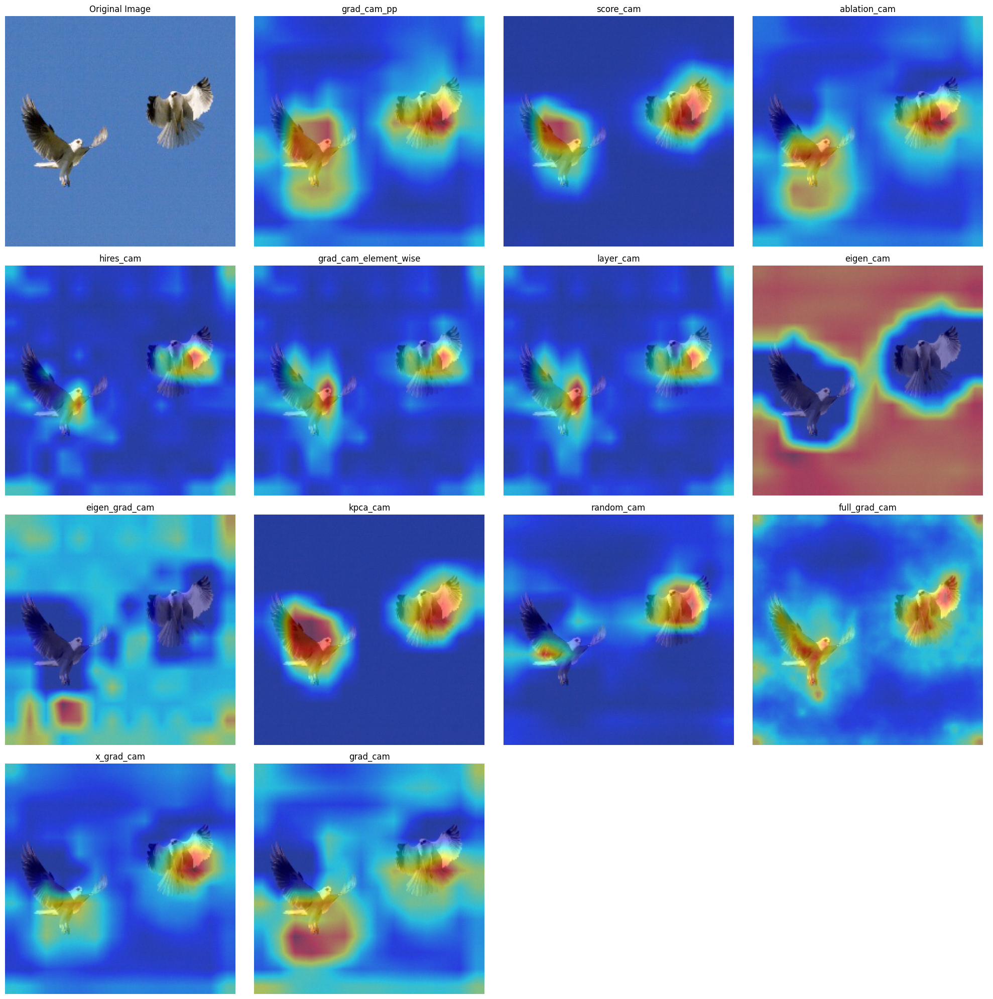

In [50]:
img_path = "../images/ILSVRC2012_val_00000073.JPEG"

grad_cam_pp = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.GRAD_CAM_PLUS_PLUS)
score_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.SCORE_CAM)
ablation_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.ABLATION_CAM)
hires_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.HI_RES_CAM)
grad_cam_element_wise = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.GRAD_CAM_ELEMENT_WISE)
layer_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.LAYER_CAM)
eigen_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.EIGEN_CAM)
eigen_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.EIGEN_GRAD_CAM)
kpca_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.KPCA_CAM)
random_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.RANDOM_CAM)
full_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.FULL_GRAD)
x_grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.X_GRAD_CAM)
grad_cam = execute_cam(img_path=img_path, preprocess=transform, model=vgg16, target_layers=target_layers, cam_type=CAMType.GRAD_CAM)


print("Combining GradCAM++ and ScoreCAM:")
rgb_img = Image.open(img_path).convert('RGB')
rgb_img = np.array(rgb_img.resize((224, 224))) / 255.0

display_images_in_rows(rgb_img=rgb_img, grayscale_list=[grad_cam_pp, score_cam, ablation_cam, hires_cam, grad_cam_element_wise, layer_cam, eigen_cam, eigen_grad_cam, kpca_cam, random_cam, full_grad_cam, x_grad_cam, grad_cam], labels=['grad_cam_pp', 'score_cam', 'ablation_cam', 'hires_cam', 'grad_cam_element_wise', 'layer_cam', 'eigen_cam', 'eigen_grad_cam', 'kpca_cam', 'random_cam', 'full_grad_cam', 'x_grad_cam', 'grad_cam'], max_images_per_row=4)